In [2]:
import cv2 as cv
import glob, os
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt




/Users/estepark/Documents/week9_tues/label/1_20181126_102202_White_Reg.png
1_20181126_102202_White_Reg.png
(646, 481, 3)


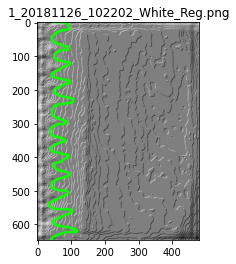

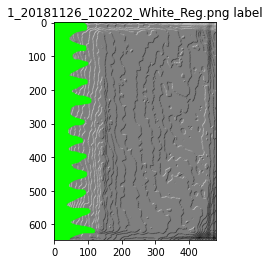

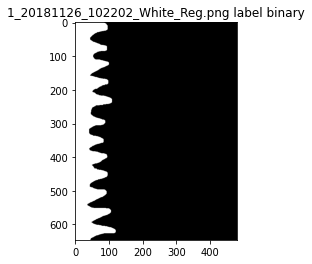

TypeError: Image data of dtype object cannot be converted to float

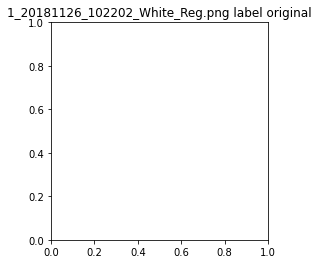

In [3]:
labels =  '/Users/estepark/Documents/week9_tues/label'

for fname in glob.glob(labels+'/*.png'):

    print(fname)
    serNum = fname.split('/')[6] 
    print(serNum)
    img  = cv.imread(fname)
    label = cv.imread('./results/{}'.format(serNum))
    labl = np.copy(img)
    
    labl_binary = np.zeros(img.shape[:2])
    print(labl.shape)
    for i in range(labl.shape[0]): 
        for j in range(labl.shape[1])[::-1]:
            if labl[i][j][0] == labl[i][j][1] == labl[i][j][2]:
                continue
            else:
                labl[i][0:j][:] = labl[i][j][:]
                labl_binary[i][0:j] = 1
                break
    plt.figure()
    plt.title(serNum)
    plt.imshow(img)
    plt.show()
    
    plt.figure()
    plt.title(serNum+' label')
    plt.imshow(labl)
    plt.show()
    
    plt.figure()
    plt.title(serNum+' label binary')
    plt.imshow(labl_binary, cmap="gray")
    plt.show()
    
    plt.figure()
    plt.title(serNum+' label original')
    plt.imshow(label, cmap="gray")
    plt.show()

In [4]:
label = label[:,:,0]
print(label.shape)
label = label/255
print('max = {}, min = {}'.format(np.max(label), np.min(label)))

TypeError: 'NoneType' object is not subscriptable

In [5]:
import scipy.fftpack
def dct2d(a):
    return scipy.fftpack.dct(scipy.fftpack.dct( a, axis=0, norm='ortho' ),axis=1,norm='ortho')
n = 0

print("img rows {}".format(label.shape[0]))
print("img cols {}".format(label.shape[1]))

# if (img.shape[0]%8 !=0):
#     floorX = math.floor(img.shape[0]/8)
#     if (img.shape[1]% 8!=0 ):
#         floorY = math.floor(img.shape[1]/8)
# imgCrop = img[0:floorX*8, 0:floorY*8 ]
ch_dct = []
not_dct = []
bad_ch = 0
bad_not = 0 
for i in range(label.shape[0]-7): 
    for j in range(label.shape[1]-7): 
        patch = label[i:i+8, j:j+8]
        
        #print(patch.shape,',',i,',',j)
        vec = dct2d(patch).flatten()
        if np.all(patch == patch[0][0]): 
            #print(i,',',j,':',vec)
            if labl_binary[i,j] == 1: 
                bad_ch += 1
            else: 
                bad_not += 1 
            continue
        if labl_binary[i,j] == 1: 
            ch_dct.append(vec)
        else: 
            not_dct.append(vec)
        assert patch.shape == (8,8)
        n = n + 1
print(n)
print(label.shape[0]*label.shape[1])
print('bad ch = {}, bad not = {}'.format(bad_ch, bad_not))




AttributeError: 'NoneType' object has no attribute 'shape'

array([[ 4.36078431, -0.40422419,  0.25588716, ...,  0.01256608,
         0.01653942, -0.07227746],
       [ 4.45490196, -0.50265387,  0.04099021, ...,  0.07769927,
         0.00468441,  0.09191548],
       [ 4.54901961, -0.43752911, -0.19791825, ...,  0.00675455,
        -0.02316418, -0.06989317],
       ...,
       [ 3.48235294, -0.12188926,  0.19791825, ..., -0.12667614,
         0.09420054, -0.02738878],
       [ 3.57647059, -0.18390525,  0.23890846, ..., -0.02198698,
        -0.09015998,  0.04477722],
       [ 3.57647059, -0.2614383 ,  0.0169787 , ...,  0.21244356,
        -0.01418131, -0.03114045]])

In [14]:
ch_dct = np.array(ch_dct)
not_dct = np.array(not_dct)
print(ch_dct.shape)

(44139, 64)


In [15]:
np.mean(ch_dct, axis=0)

array([ 4.45685565e+00, -7.78836799e-03, -2.56025724e-03, -6.01085819e-05,
       -7.83054335e-04,  3.48923835e-04, -4.85436821e-04,  9.53001710e-05,
        6.66896115e-03,  2.68288990e-04,  1.58316565e-04,  6.78538520e-05,
        5.78132115e-05, -4.26705941e-05,  8.85999956e-05, -3.75432525e-06,
        3.92221496e-05,  1.43478472e-04, -7.84045722e-05, -7.23985589e-05,
       -9.64031717e-06, -2.80751162e-05,  9.62516751e-07, -2.49910213e-05,
        6.76370889e-04,  9.00981689e-05, -1.08991274e-04, -7.40410786e-05,
        6.19073858e-05, -8.41900242e-06, -3.61164556e-06,  1.92993422e-05,
        1.33257725e-04,  1.46387272e-04, -8.41522321e-05,  3.89770553e-05,
        2.41771871e-05, -5.58010430e-05,  2.71757290e-05, -2.18186866e-05,
        2.35977089e-04, -5.32063661e-06, -4.49318475e-05,  3.72007069e-05,
       -3.53253281e-05,  2.22377967e-05,  2.91995129e-05, -4.27216754e-06,
       -1.71109823e-04,  4.11619920e-05, -8.98822265e-06,  1.65435627e-05,
       -8.32813089e-06,  

In [17]:
np.mean(not_dct, axis=0)

array([ 3.88835752e+00,  8.71098803e-03,  1.69468442e-03,  1.30441655e-03,
        2.19596628e-04,  3.01996040e-04,  1.53119405e-04,  9.86679190e-05,
        8.51464992e-03, -1.79469781e-04, -4.97980993e-05, -2.44080414e-05,
       -1.65054632e-05,  9.70912924e-06, -2.65976720e-05,  9.04550665e-07,
       -4.35737895e-04, -3.53987832e-05,  3.15590884e-05,  1.48314222e-05,
        6.55181164e-06,  6.02877772e-06, -1.09299377e-06,  6.46189191e-06,
        1.23409390e-03, -2.83081573e-05,  2.55265571e-05,  2.01692251e-05,
       -1.83979304e-05,  1.69459536e-07,  1.16591584e-06, -5.23927527e-06,
       -7.19900234e-05, -4.35317353e-05,  2.41314352e-05, -1.22762389e-05,
       -6.48413371e-06,  1.66749442e-05, -7.37523710e-06,  6.58149131e-06,
        3.25343428e-04,  1.53145785e-07,  1.34374448e-05, -1.13362771e-05,
        1.12044570e-05, -7.36195798e-06, -8.23009155e-06,  8.26378777e-07,
       -8.65282831e-05, -7.30469709e-06,  5.33577599e-07, -4.73559660e-06,
        2.09865342e-06, -

In [18]:
foreground = ch_dct
background = not_dct
total = ch_dct.shape[0] + not_dct.shape[0]
print(total==n)

# suspected that valid ch has lower probability considering 
# it takes less area of the total image
# P_Y=y
prior_ch = ch_dct.shape[0]/ total
# P_X=x
prior_chNot = not_dct.shape[0]/ total
print("Probability RV Y=valid ch: {}".format(prior_ch))
print("Probability RV X=invalid ch: {}".format(prior_chNot))


True
Probability RV Y=valid ch: 0.22175721706976417
Probability RV X=invalid ch: 0.7782427829302359


In [19]:
#MLE for background
N = background.shape[1]
base_BG = np.zeros(background.shape[1]) + (-N/2 * np.log(2 * np.pi))
mean_BG = np.mean(background,axis = 0)
var_BG = np.var(background,axis = 0)
se_BG = np.sqrt(var_BG)
cov_BG = np.cov(background.T)
temp = np.sum((background - mean_BG / np.sqrt(var_BG)) ** 2,axis = 0)
MLE_BG = base_BG - N * np.log(var_BG) - 0.5 * temp

In [20]:
from scipy.stats import norm
import matplotlib.pyplot as plt

#MLE for foreground
N = foreground.shape[0] # nubmer of rows in valid ch mat 
base_FG = np.zeros(foreground.shape[1]) + (-N/2 * np.log(2 * np.pi))
mean_FG = np.mean(foreground,axis = 0)
var_FG = np.var(foreground,axis = 0)
se_FG = np.sqrt(var_FG)
cov_FG = np.cov(foreground.T)

# contrast? normlaize 
temp = np.sum((foreground - mean_FG / np.sqrt(var_FG)) ** 2,axis = 0)
MLE_FG_log = base_FG - N * np.log(var_FG) - 0.5 * temp

In [21]:
def kl_divergence(p, q):
    return np.sum(np.where(p != 0, p * np.log(q / p), 0))

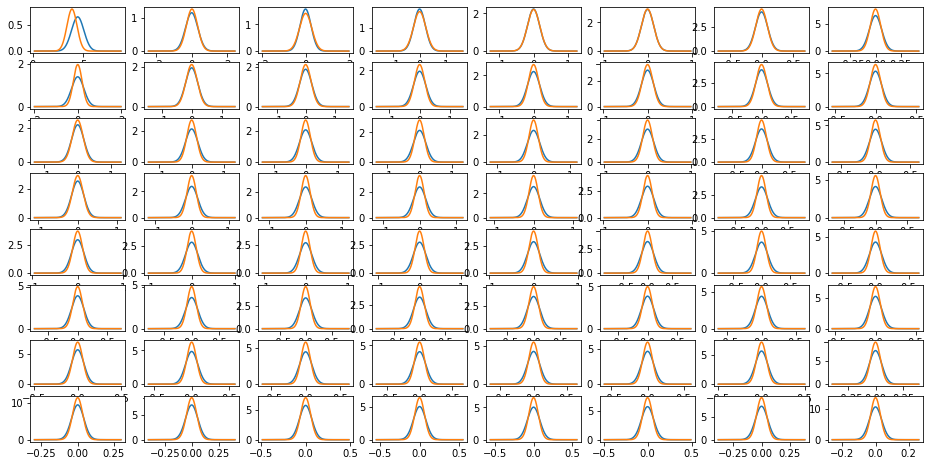

In [22]:
#marginal density plot
from scipy.stats import norm
from scipy.special import kl_div
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(16,8))
KL_distance = []
mean_distance = np.zeros(foreground.shape[1])
for i in range(foreground.shape[1]):
    fig.add_subplot(8,8,i+1)
    x_FG = np.linspace(mean_FG[i] - 7 * se_FG[i] ,mean_FG[i] + 7 * se_FG[i],500)
    x_BG = np.linspace(mean_BG[i] - 7 * se_BG[i], mean_BG[i] + 7 * se_BG[i],500)
    x = np.sort(np.array([x_FG,x_BG]),axis = None)
    y_cheetah = norm.pdf(x,mean_FG[i],se_FG[i])
    y_grass = norm.pdf(x,mean_BG[i],se_BG[i])
    KL = kl_divergence(y_grass,y_cheetah)
    KL_distance.append(KL)
    mean_distance[i] = abs(mean_FG[i] - mean_BG[i])
    plt.plot(x,y_cheetah,x,y_grass)
#     title = "Fit result for the %d feature" %(i+1)
#     plt.title(title)
plt.show()

In [23]:
# define the zigzag transformation
zig_zag = np.array([[0,1,5,6,14,15,27,28],[2,4,7,13,16,26,29,42],[3,8,12,17,25,30,41,43],
                   [9,11,18,24,31,40,44,53],[10,19,23,32,39,45,52,54],[20,22,33,38,46,51,55,60],
                   [21,34,37,47,50,56,59,61],[35,36,48,49,57,58,62,63]])
zz_flat = zig_zag.flatten()
def zig_zag_transform(a):
    result = np.zeros(64)
    for i in range(64):
        result[zz_flat[i]] = a[i]
    return result

In [ ]:
from scipy.stats import multivariate_normal
import time
start = time.time()
from numpy.linalg import inv,det


cov_FG_inv = inv(cov_FG)
cov_BG_inv = inv(cov_BG)
cov_FG_det = det(cov_FG)
cov_BG_det = det(cov_BG)

for fname in glob.glob(path+'/*.Png'):  
    A = []
    serNum = fname.split('/')[6] 
    img  = cv.imread(fname)
    imgray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    
    imgFilt = cv.bilateralFilter(imgray, 15, 75, 75)
    diag_img = signal.convolve2d(imgFilt, np.array(kern), boundary='symm', mode='same')
    im = (diag_img+2)/4
    #im = (((diag_img+2))/4*255).astype(np.uint8) #bc min=-2 and max=+2
    im_array = np.array(im)
    for i in range(0,len(im_array)-8):
        for j in range(0,im_array.shape[1]-8):
            FG,BG = 0,0
            row_start,row_end = i,i+8
            col_start,col_end = j,j+8
            block = im_array[row_start:row_end,col_start:col_end]
            block_dct = dct2d(block).flatten()
            #block_dct = zig_zag_transform(block_dct)
            # foreground
    #         temp = block_dct - mean_FG
    #         temp1 = temp[:,np.newaxis]
    #         temp2 = (temp1.T.dot(cov_FG_inv)).dot(temp1)
    #         temp3 = np.log((2*np.pi)**64 * cov_FG_det) - 2 * np.log(prior_cheetah)
    #         FG = temp2 + temp3
            FG = multivariate_normal.pdf(block_dct,mean=mean_FG,cov=cov_FG)*prior_ch
            #print(block_dct)
            #background
    #         temp = block_dct - mean_BG
    #         temp1 = temp[:,np.newaxis]
    #         temp2 = (temp1.T.dot(cov_BG_inv)).dot(temp1)
    #         temp3 = np.log((2*np.pi)**64 * cov_BG_det) - 2 * np.log(prior_grass)
    #         BG = temp2 + temp3
            BG = multivariate_normal.pdf(block_dct,mean=mean_BG,cov=cov_BG)*prior_chNot
            print(i,',',j,':',FG,',',BG)
            if (FG) >= (BG):
                A.append(0)
            else:
                A.append(1)  
    A = np.array(A)
    A_matrix = np.reshape(A,(i+1,j+1))
    plt.figure()
    plt.imshow(A_matrix, cmap="gray")
    plt.show()
    break

end = time.time()
print(end - start)
    

0 , 0 : 1.6826038292998107e+19 , 2360763303574.916
0 , 1 : 1.1104765593961769e+19 , 756421101775.8794
0 , 2 : 1394823259586619.5 , 46352.334149054215
0 , 3 : 411386948769196.6 , 2142.8551980467246
0 , 4 : 9499386891337.22 , 0.4552936243513126
0 , 5 : 1381835025.323814 , 2.0480517393757738e-06
0 , 6 : 14072721.242698215 , 1.1570363258563563e-10
0 , 7 : 85351962.42026652 , 2.545185063286008e-09
0 , 8 : 4001793.896164072 , 1.0760839721821434e-11
0 , 9 : 158212353.98000214 , 4.892348540062278e-09
0 , 10 : 4068315491.717132 , 1.713791546246022e-06
0 , 11 : 20657011172.57259 , 4.0112752020851866e-05
0 , 12 : 94976476942.15633 , 0.0005168483014555482
0 , 13 : 4534670827630185.0 , 64957.66484810325
0 , 14 : 3.64866696406032e+19 , 496153901101.7856
0 , 15 : 5.618948515215947e+20 , 71893793649502.53
0 , 16 : 7.640033779243937e+21 , 1.0928128806025604e+16
0 , 17 : 4.701209701435532e+25 , 4.498487071157051e+22
0 , 18 : 6.027173226370276e+26 , 3.535322821360439e+24
0 , 19 : 3.062449173780475e+31 , 

In [1]:
A_matrix = np.reshape(A,(638,473))

NameError: name 'np' is not defined

In [ ]:
plt.figure()
plt.imshow(A_matrix, cmap="gray")
plt.show()

In [ ]:
print(A_matrix)

In [ ]:
ch_dct[0]